In [2]:
import os
import glob
import gc
import random

from pathlib import Path

import numpy as np
import pandas as pd
import h5py

from scipy.sparse import csr_matrix
from pathlib import Path

import scipy

from scipy.stats import median_abs_deviation, percentileofscore
from sklearn.metrics import silhouette_score, confusion_matrix
from sklearn.metrics.pairwise import cosine_similarity

import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
import seaborn as sns

import anndata as ad
import scanpy.external as sce
import scanpy as sc

import pegasus as pg
from pegasusio import UnimodalData, MultimodalData
import scrublet as scr

from tqdm import tqdm

%matplotlib inline

sc.settings.n_jobs = 25

random.seed(0)
np.random.seed(0)
sc.settings.seed = 0

In [2]:
SEBASTIAN_SRR_FOLDERS = glob.glob('/mnt/sdb/scz_meta_analysis_processed/sebastian_pak/star_outputs/*_Solo.out/')

In [3]:
## Functions Iterate Through Folders And Build H5 ##

def assemble_library_annata(srr_folder):
    
    ''' takes the path to an SRR_Solo.out/ and generates the anndata object '''
    
    #raw_path = Path(srr_folder) / "Gene/raw"
    raw_path = Path(srr_folder) / "Gene/filtered"
    adata = sc.read_mtx(raw_path / "matrix.mtx").T
    adata.var = pd.read_csv(raw_path / "features.tsv", delimiter="\t", header=None, names=['gene_symbols', 'assay'])
    adata.obs = pd.read_csv(raw_path / "barcodes.tsv", header=None, index_col=0, names=['barcodes'])
    adata.obs_names = [srr_folder.split('/')[-2].split('_')[0] + '_' + obs_name for obs_name in adata.obs_names] 
    adata.obs['library'] = srr_folder.split('/')[-2].split('_')[0]
    
    return adata

def concatenate_libraries(srr_folder_list):

    library_list = []
    
    for srr_folder in tqdm(srr_folder_list):    
        library_list.append(assemble_library_annata(srr_folder))
        #print('Loaded {0}'.format(srr_folder.split('/')[-2].split('_')[0]))

    concatted = sc.concat(library_list, join='outer', label="library")
    concatted.var['feature_types'] = 'Gene Expression'
    
    return concatted

In [4]:
sebastian_adata = concatenate_libraries(SEBASTIAN_SRR_FOLDERS)

sebastian_adata.obs['Run'] = [i.split('_')[0] for i in sebastian_adata.obs_names]

sebastian_adata.obs['barcodes'] = sebastian_adata.obs_names

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 76/76 [00:53<00:00,  1.42it/s]


In [5]:
glob.glob('/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/GEO_files/*')[0:5]

## note: GEO Files contain metadata in titles, but more easily extracted from GEO sample names ##

['/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/GEO_files/GSM7118672_10X-Pak-CD19-Cre-P61-Live-20200723-3v3-1hg-1hg_filtered_feature_bc_matrix.h5',
 '/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/GEO_files/GSM7118654_10X-Pak-1C-d100-Methanol-Fixed-20221216-3v3-1DI-hg_filtered_feature_bc_matrix.h5',
 '/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/GEO_files/GSM7118657_10X-Pak-C9632-20210324-3v3-1hg_filtered_feature_bc_matrix.h5',
 '/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/GEO_files/GSM7118675_10X-Pak-Flp-d100-Methanol-Fixed-20221216-3v3-1DI-hg_filtered_feature_bc_matrix.h5',
 '/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/GEO_files/GSM7118668_10X-Pak-4C-d100-Methanol-Fixed-20221216-3v3-1DI-hg_filtered_feature_bc_matrix.h5']

In [6]:
glob.glob('/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/*')

['/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/tmp',
 '/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/raw_data',
 '/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/fastq',
 '/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/metadata',
 '/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/GEO_files',
 '/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/accession_list.txt',
 '/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/second_round_fastqs']

In [9]:
## Merge SRA Metadata ##

## SRA MetaData Import ##

sebastian_sra_metadata = pd.read_csv('/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/metadata/Sebastian_SRA_RunTable.csv')

# get rid of WGS sample, keep useful cols

sebastian_sra_metadata_essential = sebastian_sra_metadata[['Run', 'BioProject', 'BioSample',
                                                            'cell_line', 'Center Name', 
                                                           'Experiment', 'genotype', 'Instrument', 'Library Name',
                                                            'procedure', 'ReleaseDate', 'create_date', 'Sample Name',
                                                           'SRA Study', 'time_point']][1::]

sebastian_sra_metadata_essential.rename({'cell_line':'Patient Derived'}, axis=1, inplace=True)

sebastian_adata.obs = sebastian_adata.obs.merge(sebastian_sra_metadata_essential, left_on='Run', right_on='Run', how='left')

sebastian_adata.obs.index = sebastian_adata.obs['barcodes']

In [10]:
## Sample Experimental Sheet ##

sebastian_sample_condition_df = pd.read_csv('/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/metadata/Sebastian_Sample_Names_Donor_Map.csv', 
                                            header=None, names=['Sample_Name','Condition'])

# Extracting the Cell Line and Converting Cell Line to Homogenous Naming ##

sebastian_sample_condition_df['Cell_Line'] = sebastian_sample_condition_df['Condition'].str.split('-').apply(lambda x: x[0])

True_Donor_Dict = {'1C': 'C3141a', 
                   '4C': 'C2320b',
                   '1N': 'N3320a',
                   '4N': 'N0575a'}

sebastian_sample_condition_df['Cell_Line'] = sebastian_sample_condition_df['Cell_Line'].apply(lambda x: True_Donor_Dict[x] if x in True_Donor_Dict.keys() else x)

## Merging ##

sebastian_adata.obs = sebastian_adata.obs.merge(sebastian_sample_condition_df, left_on='Sample Name', right_on='Sample_Name', how='left')
sebastian_adata.obs.index = sebastian_adata.obs['barcodes']

In [11]:
## Map NCBI Gene Names w/Prasanth's File ##

# load prasanth's annotation file
prasanth_annot = pd.read_csv('/home/deepak/datasets/annotations/all_genes_EnsemblInfo_104.csv')

# merge prasanth's gene info into the var dataframe
sebastian_adata.var['ensembl_gene_id'] = sebastian_adata.var.index
sebastian_adata.var = sebastian_adata.var.merge(prasanth_annot, left_on='ensembl_gene_id', right_on='ensembl_gene_id', how='left')
sebastian_adata.var.chromosome_name = sebastian_adata.var.chromosome_name.astype('str')

# fix gene name that is NaN
sebastian_adata.var.loc[sebastian_adata.var['hgnc_symbol'].isna(),'hgnc_symbol'] = sebastian_adata.var.loc[sebastian_adata.var['hgnc_symbol'].isna(),'ensembl_gene_id']

#reset the index as the hgnc_symbol
sebastian_adata.var.index = sebastian_adata.var['hgnc_symbol']
sebastian_adata.var.index.name = None

#some ensembls map to same hgnc so we make them unique
sebastian_adata.var_names_make_unique(join='#')

gc.collect()

/tmp/ipykernel_3147873/3523849290.py:4: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  prasanth_annot = pd.read_csv('/home/deepak/datasets/annotations/all_genes_EnsemblInfo_104.csv')


56215

In [12]:
## Donor Metadata From Table 1 of Paper ##

sebastian_donor_metadata = pd.read_csv('/mnt/sda/scz_meta_analysis/sebastian_pak_nat_comm_2023/metadata/Sebastian_Donor_Metadata.csv')
sebastian_donor_metadata['Donor'] = sebastian_donor_metadata['Line ID'].str.replace('\xa0', ' ')
sebastian_donor_metadata['Donor'] = sebastian_donor_metadata['Donor'].str.replace('NRXN1 cKO H1 hESCs', 'H1')
sebastian_donor_metadata['Donor'] = sebastian_donor_metadata['Donor'].str.replace(r'\s+iPSC$', '', regex=True)

# Sebastian Donor column needs to be True Donor to match Donor Metadata ##

sebastian_adata.obs['Donor'] = sebastian_adata.obs['Cell_Line'].str.replace('Cre', 'H1').str.replace('Flp', 'H1')
sebastian_adata.obs['Donor'] = sebastian_adata.obs['Donor'].str.replace('C8905', 'C8905a')

sebastian_adata.obs = sebastian_adata.obs.merge(sebastian_donor_metadata, 
                                            left_on='Donor', 
                                            right_on='Donor', how='left').set_index('barcodes')

In [13]:
print(sebastian_adata.obs.shape[0])
print(sebastian_adata.obs['Sex'].value_counts())

## Note of of the Donor IDs don't have a Sex ##
# We will need to Impute Later ##

413635
Sex
M    270135
F    143500
Name: count, dtype: int64


In [14]:
## Remove Duplicate Barcodes ##

print(sebastian_adata.obs_names.duplicated(keep=False).any())
print(sebastian_adata.var_names.duplicated(keep=False).any())

# None

False
False


In [15]:
## Set Up QC Metrics ##

# filter on robust genes
# annotate_robust_genes_scanpy(integrated, percent_cells=0.05)
pg.identify_robust_genes(sebastian_adata, percent_cells=0.05)
sebastian_adata = sebastian_adata[:,sebastian_adata.var['robust']].copy()
gc.collect()

# mitochondrial genes, "MT-" for human, "Mt-" for mouse
sebastian_adata.var["mt"] = sebastian_adata.var_names.str.startswith("MT-")
# ribosomal genes
sebastian_adata.var["ribo"] = sebastian_adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
sebastian_adata.var["hb"] = sebastian_adata.var_names.str.contains("^HB[^(P)]")

# add protein_coding genes
sebastian_adata.var['protein_coding'] = sebastian_adata.var['gene_biotype'].apply(lambda x: True if 'protein_coding' == x else False)
sebastian_adata.var['protein_coding'] = sebastian_adata.var['protein_coding'].astype('bool')

# define mitocarta_genes
mitocarta_df = pd.read_csv('/home/deepak/datasets/annotations/Human.MitoCarta3.0.csv')
sebastian_adata.var['mitocarta'] = [True if x in list(mitocarta_df['Symbol']) else False for x in sebastian_adata.var.index]

# define robust_protein_coding genes (exclude ribosomal (RPL,RPS), mitochondrial, or mitocarta genes
sebastian_adata.var['robust_protein_coding'] = sebastian_adata.var['robust'] & sebastian_adata.var['protein_coding']
sebastian_adata.var.loc[sebastian_adata.var.ribo, 'robust_protein_coding'] = False
sebastian_adata.var.loc[sebastian_adata.var.mt, 'robust_protein_coding'] = False
sebastian_adata.var.loc[sebastian_adata.var.mitocarta, 'robust_protein_coding'] = False

# define robust_protein_coding_autosome genes (exclude ribosomal (RPL,RPS), mitochondrial, or mitocarta genes
sebastian_adata.var['autosome'] = sebastian_adata.var.chromosome_name.isin([str(i) for i in range(1,23)])
sebastian_adata.var['robust_protein_coding_autosome'] = sebastian_adata.var['robust_protein_coding'] & sebastian_adata.var['autosome'] 

2026-01-28 19:43:26,880 - pegasus.tools.preprocessing - INFO - After filtration, 30884/33538 genes are kept. Among 30884 genes, 19906 genes are robust.
2026-01-28 19:43:26,881 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 4.78s.


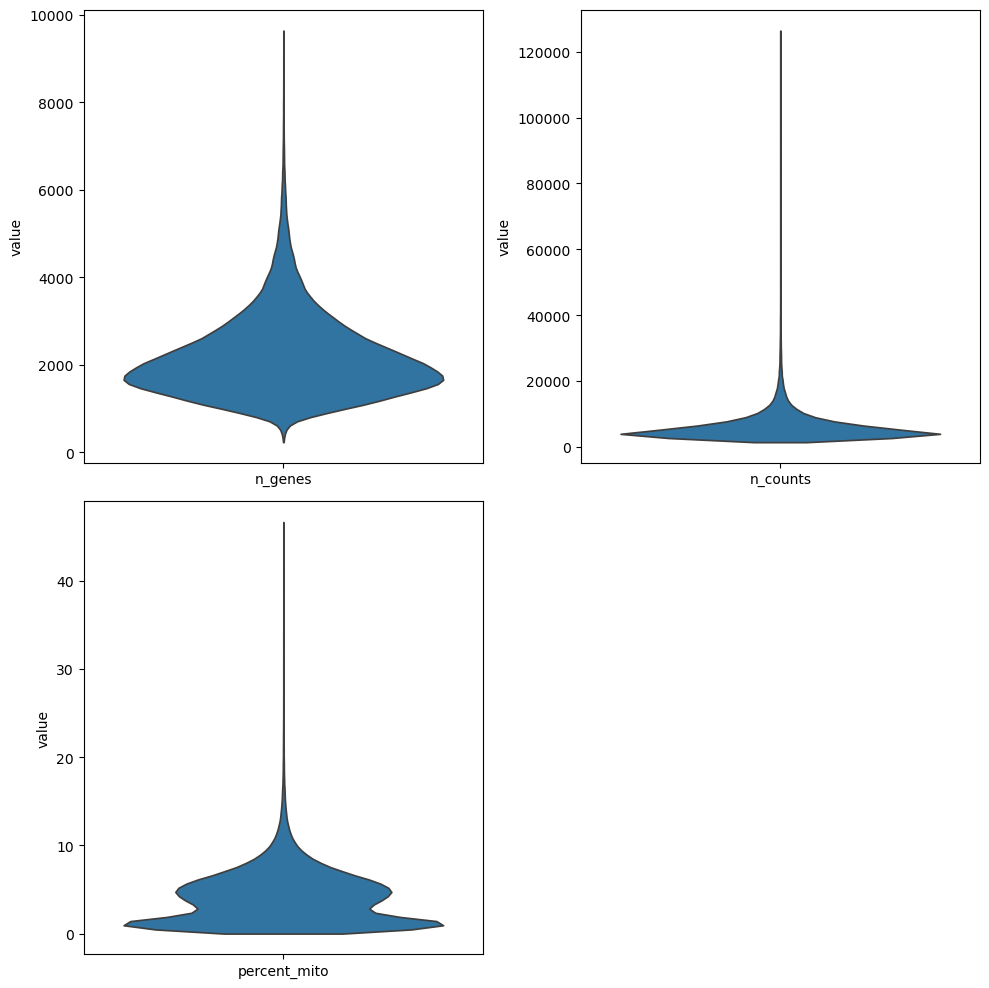

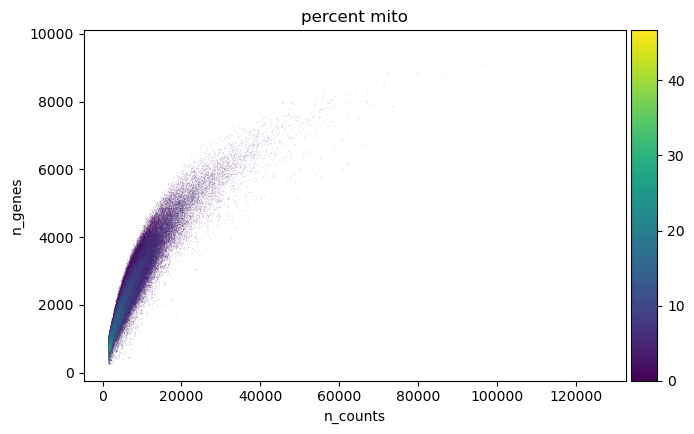

The 99th percentile all sample genes/cell is: 3995.0
The 99th percentile all sample total counts/cell is: 13764.0
The 99th percentile all sample mitochondrial % /cell is: 9.284813976287841


In [16]:
## Plot QC Metrics ##

# QC by counts #
# convert to pegasus unimodal object
sebastian_adata = UnimodalData(sebastian_adata)
pg.qc_metrics(sebastian_adata, mito_prefix='MT-')

# Create a figure with 3 subplots

# convert back for plotting to scanpy anndata
sebastian_adata = sebastian_adata.to_anndata()
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.flatten()
sc.pl.violin(sebastian_adata, "n_genes", ax=axes[0], show=False, stripplot=False)
sc.pl.violin(sebastian_adata, "n_counts", ax=axes[1], show=False, stripplot=False)
sc.pl.violin(sebastian_adata, "percent_mito", ax=axes[2], show=False, stripplot=False)
fig.delaxes(axes[3])
plt.tight_layout()

sc.pl.scatter(sebastian_adata, "n_counts", "n_genes", color="percent_mito")

print('The 99th percentile all sample genes/cell is: {0}'.format(np.percentile(sebastian_adata.obs['n_genes'], 95)))

print('The 99th percentile all sample total counts/cell is: {0}'.format(np.percentile(sebastian_adata.obs['n_counts'], 95)))

print('The 99th percentile all sample mitochondrial % /cell is: {0}'.format(np.percentile(sebastian_adata.obs['percent_mito'], 95)))

n_UMIs lower: 1709 upper: 14279
n_genes lower: 890 upper: 4429


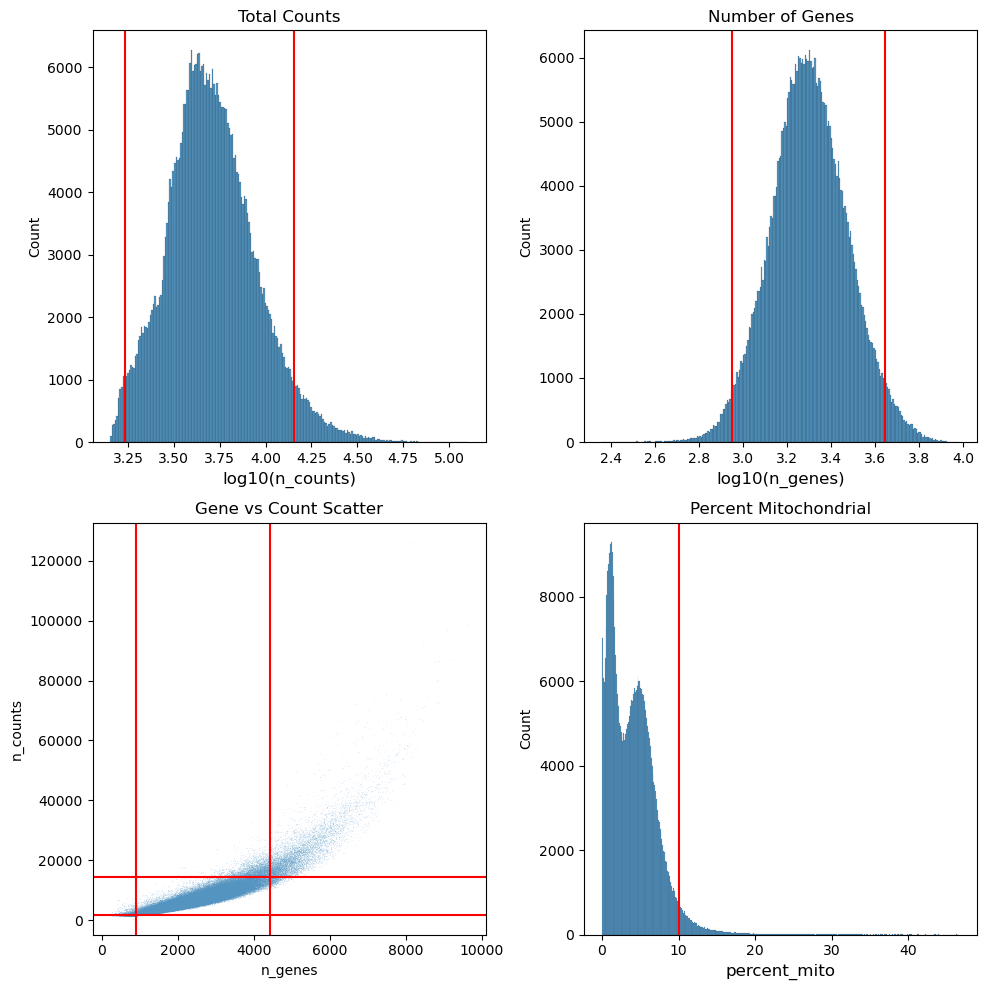

In [17]:
## Visualizating QC Cutoffs ##

MAD = 3

def qc_boundary(counts, k=MAD):
    x = np.log1p(counts)
    mad = median_abs_deviation(x)
    return np.exp(np.median(x) - k*mad), np.exp(np.median(x) + k*mad)

### nUMI and nGene QCs
n_counts_lower, n_counts_upper = qc_boundary(sebastian_adata.obs.n_counts, k=MAD)
print('n_UMIs lower: %d upper: %d' % (n_counts_lower, n_counts_upper))

n_genes_lower, n_genes_upper = qc_boundary(sebastian_adata.obs.n_genes, k=MAD)
print('n_genes lower: %d upper: %d' % (n_genes_lower, n_genes_upper))

## Plot Changes to Counts and Genes/Cell Distributions ##

fig, axs = plt.subplots(2, 2, figsize=(10, 10))  # 2x2 grid, adjust size as needed

# Plot 1: log10(n_counts)
sns.histplot(np.log10(sebastian_adata.obs.n_counts), ax=axs[0, 0])
axs[0, 0].axvline(np.log10(n_counts_lower), color='red')
axs[0, 0].axvline(np.log10(n_counts_upper), color='red')
axs[0, 0].set_xlabel('log10(n_counts)', fontsize=12)
axs[0, 0].set_title("Total Counts")

# Plot 2: log10(n_genes)
sns.histplot(np.log10(sebastian_adata.obs.n_genes), ax=axs[0, 1])
axs[0, 1].axvline(np.log10(n_genes_lower), color='red')
axs[0, 1].axvline(np.log10(n_genes_upper), color='red')
axs[0, 1].set_xlabel('log10(n_genes)', fontsize=12)
axs[0, 1].set_title("Number of Genes")

# Plot 3: scatter plot of n_genes vs n_counts
sns.scatterplot(x=sebastian_adata.obs.n_genes, y=sebastian_adata.obs.n_counts, alpha=0.5, s=0.1, ax=axs[1, 0])
axs[1, 0].axhline(n_counts_lower, color='red')
axs[1, 0].axhline(n_counts_upper, color='red')
axs[1, 0].axvline(n_genes_lower, color='red')
axs[1, 0].axvline(n_genes_upper, color='red')
axs[1, 0].set_xlabel('n_genes')
axs[1, 0].set_ylabel('n_counts')
axs[1, 0].set_title("Gene vs Count Scatter")

# Plot 4: percent_mito
sns.histplot(sebastian_adata.obs.percent_mito, ax=axs[1, 1])
axs[1, 1].axvline(10, color='red')
axs[1, 1].set_xlabel('percent_mito', fontsize=12)
axs[1, 1].set_title("Percent Mitochondrial")

plt.tight_layout()
plt.show()

n_cells before QC: 413635
n_cells after QC: 413635
mean n_cells before QC 5442.565789473684
mean n_cells after QC 5442.565789473684


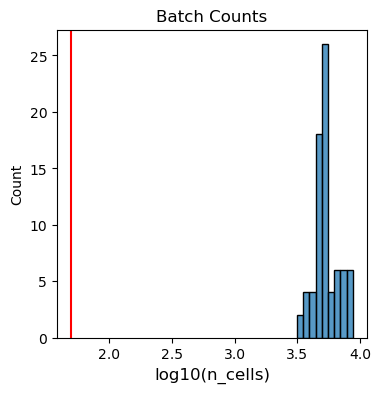

remove 0 batches that have cells less than 50


In [18]:
## Minimum Cell Cutoffs Based on Donor-Batches ##

args_min_n_cells = 50

n_cells_before_qc = sebastian_adata.obs.library.value_counts().rename_axis('library').reset_index(name='counts')
n_cells_after_qc = sebastian_adata.obs[sebastian_adata.obs.passed_qc].library.value_counts().rename_axis('library').reset_index(name='counts')

print('n_cells before QC:', np.sum(n_cells_before_qc[n_cells_before_qc.counts>0].counts))
print('n_cells after QC:', np.sum(n_cells_after_qc[n_cells_after_qc.counts>0].counts))

print('mean n_cells before QC', np.mean(n_cells_before_qc[n_cells_before_qc.counts>0].counts))
print('mean n_cells after QC', np.mean(n_cells_after_qc[n_cells_after_qc.counts>0].counts))

# Plot Distribution of Donor-Batches on Being Greater than Zero
plt.figure(figsize=(4, 4))
plt.title('Batch Counts')
sns.histplot(np.log10(n_cells_before_qc[n_cells_before_qc.counts>0].counts))
plt.axvline(np.log10(args_min_n_cells), color='red')
plt.xlabel('log10(n_cells)', fontsize=12)
plt.show()

### n_cells QC

#identify donor-batches with less than 50 cells of contribution
n_cells_outlier = list(n_cells_after_qc[n_cells_after_qc.counts<args_min_n_cells].library)
# set these to have failed QC as well
sebastian_adata.obs.loc[sebastian_adata.obs.library.isin(n_cells_outlier),'passed_qc'] = False
print('remove {0} batches that have cells less than {1}'.format(len(n_cells_outlier), args_min_n_cells))

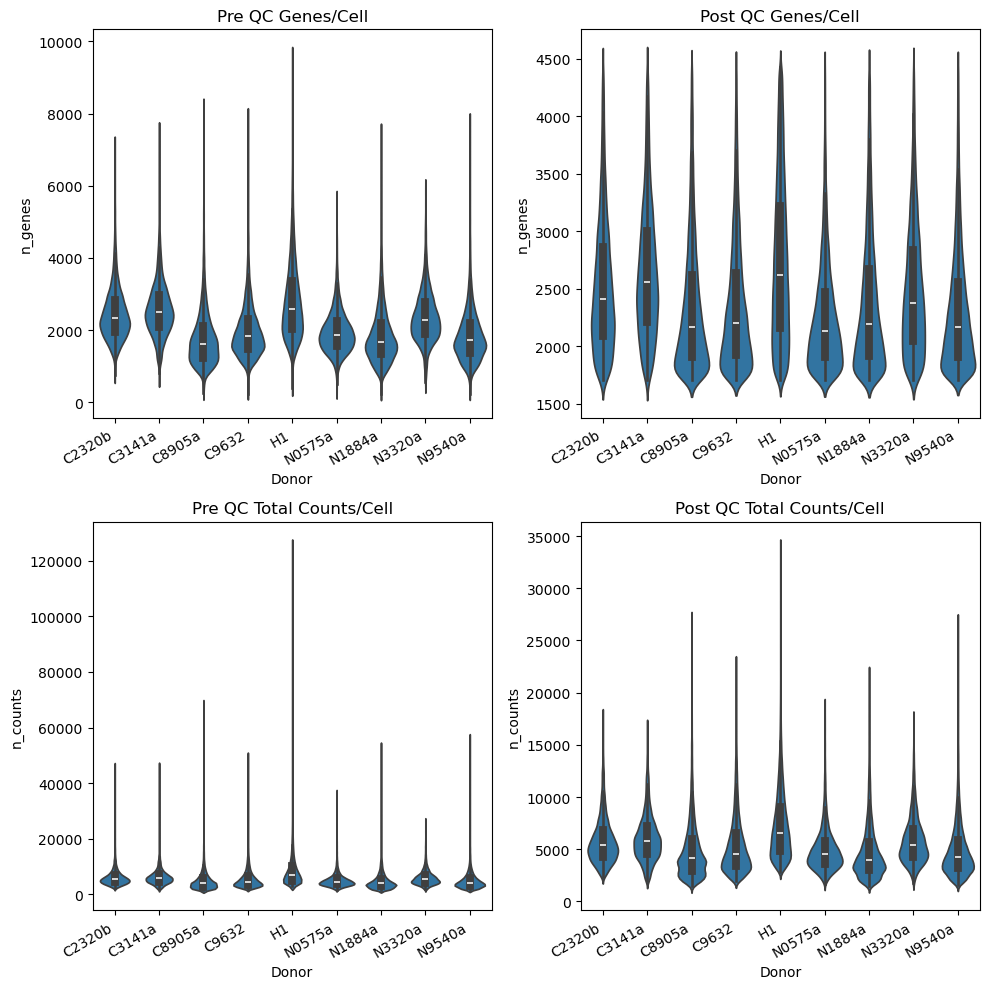

In [19]:
## Trialing QC Cutoffs Before and After ##

## Boolean Cutoffs for UMIs and Genes/Cell ##

counts_filter = (n_counts_lower < sebastian_adata.obs.n_genes) & (sebastian_adata.obs.n_genes < n_counts_upper)
genes_filter = (n_genes_lower < sebastian_adata.obs.n_genes) & (sebastian_adata.obs.n_genes < n_genes_upper)

# Plot Changes With Violins 

fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.flatten()
sns.violinplot(data=sebastian_adata.obs, y='n_genes', x='Donor', ax=axes[0])
axes[0].set_title('Pre QC Genes/Cell')
plt.setp(axes[0].get_xticklabels(), rotation=30, ha='right')

sns.violinplot(data=sebastian_adata.obs[counts_filter & genes_filter], x='Donor', y='n_genes', ax=axes[1])
axes[1].set_title('Post QC Genes/Cell')
plt.setp(axes[1].get_xticklabels(), rotation=30, ha='right')

sns.violinplot(data=sebastian_adata.obs, y='n_counts', x='Donor', ax=axes[2])
axes[2].set_title('Pre QC Total Counts/Cell')
plt.setp(axes[2].get_xticklabels(), rotation=30, ha='right')

sns.violinplot(data=sebastian_adata.obs[sebastian_adata.obs.passed_qc & genes_filter], x='Donor', y='n_counts', ax=axes[3])
axes[3].set_title('Post QC Total Counts/Cell')
plt.setp(axes[3].get_xticklabels(), rotation=30, ha='right')

plt.tight_layout()
plt.show()

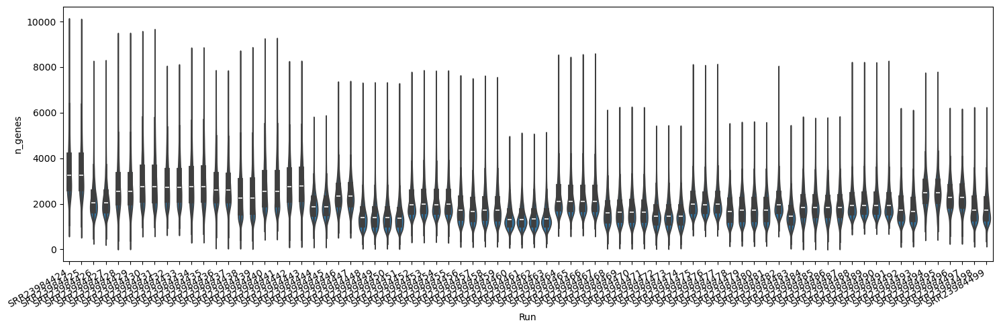

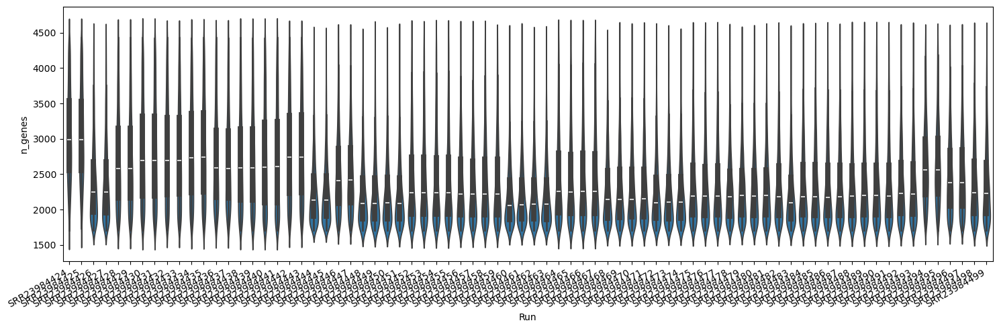

In [22]:
plt.figure(figsize=(15,5))
sns.violinplot(data=sebastian_adata.obs, x='Run', y='n_genes')
plt.xticks(rotation=30, ha='right')
plt.tight_layout()

plt.figure(figsize=(15,5))
sns.violinplot(data=sebastian_adata.obs[counts_filter & genes_filter], x='Run', y='n_genes')
plt.xticks(rotation=30, ha='right')
plt.tight_layout()

In [23]:
## Remove Cells That Don't Meet Total Counts/Cell and Genes/Cell Thresholds ##

sebastian_adata = MultimodalData(UnimodalData(sebastian_adata, modality="rna"))

pg.qc_metrics(sebastian_adata, 
              min_genes=n_genes_lower, max_genes=n_genes_upper,
              min_umis=n_counts_lower, max_umis=n_counts_upper,
              mito_prefix='MT-', percent_mito=10)

pg.filter_data(sebastian_adata)
gc.collect()
sebastian_adata = sebastian_adata.to_anndata()

2026-01-28 19:43:46,076 - pegasusio.qc_utils - INFO - After filtration, 370573 out of 413635 cell barcodes are kept in UnimodalData object unknown-rna.
2026-01-28 19:43:46,077 - pegasus.tools.preprocessing - INFO - Function 'filter_data' finished in 0.82s.


In [24]:
## Filter Cells and Genes With Raw Cutoffs #

# store raw counts in layer
sebastian_adata.layers["raw_counts"] = sebastian_adata.X

# Note: No cells fail this cutoff affter using MAD based filtration
print((sebastian_adata.obs.n_genes < 100).sum())
print((sebastian_adata.var.n_cells < 20).any())

# Doing This For Completeness
sc.pp.filter_cells(sebastian_adata, min_genes=100)
sc.pp.filter_genes(sebastian_adata, min_cells=20)

0
False


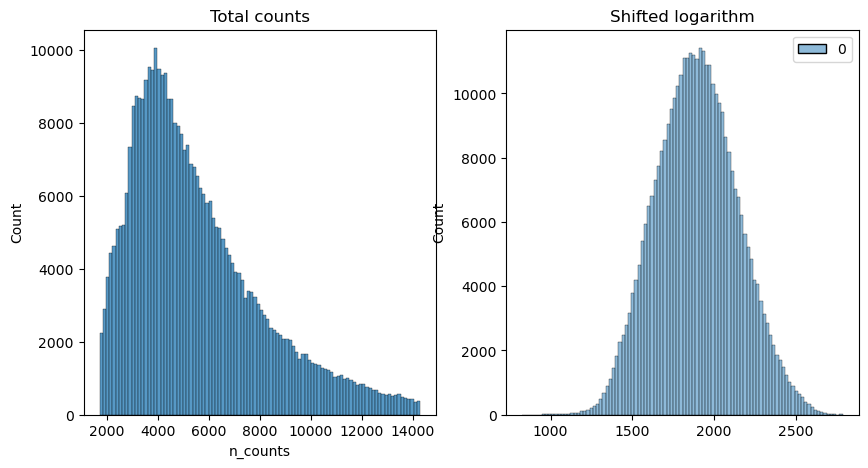

In [25]:
## Log Normalization ##

# normalize 
scales_counts = sc.pp.normalize_total(sebastian_adata, layer='raw_counts', target_sum=None, inplace=False)

# log1p transform
sebastian_adata.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

# set X as log1p normed counts
sebastian_adata.X = sebastian_adata.layers["log1p_norm"]

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(sebastian_adata.obs["n_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(sebastian_adata.layers["log1p_norm"].sum(1), bins=100, kde=False, ax=axes[1])
axes[1].set_title("Shifted logarithm")
plt.show()

2026-01-28 19:44:11,308 - pegasus.tools.utils - INFO - Loaded signatures from GMT file /home/deepak/pixi_envs/pegasus/.pixi/envs/default/lib/python3.10/site-packages/pegasus/data_files/cell_cycle_human.gmt.
2026-01-28 19:44:11,311 - pegasus.tools.signature_score - INFO - Signature G1/S: 43 out of 43 genes are used in signature score calculation.
2026-01-28 19:44:12,469 - pegasus.tools.signature_score - INFO - Signature G2/M: 54 out of 54 genes are used in signature score calculation.
2026-01-28 19:44:13,775 - pegasus.tools.signature_score - INFO - Function 'calc_signature_score' finished in 5.26s.
2026-01-28 19:44:45,266 - pegasus.tools.preprocessing - INFO - Function 'pca' finished in 15.63s.


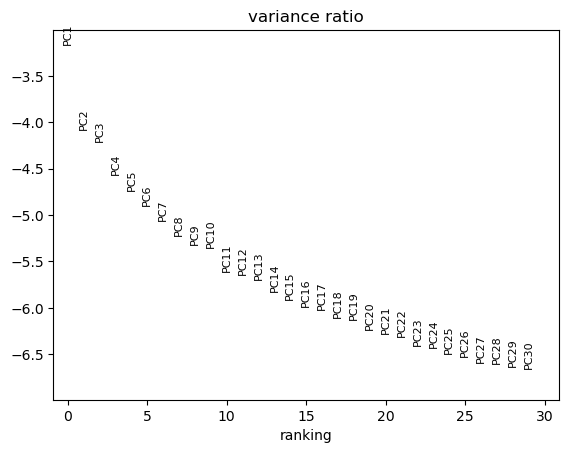

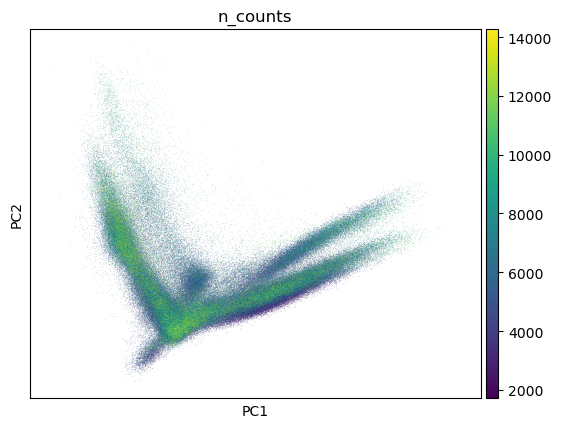

There is 16.471439686390212 variance explained by these components
2026-01-28 19:44:46,640 - pegasus.tools.preprocessing - INFO - Function 'regress_out' finished in 0.33s.
2026-01-28 19:44:46,642 - pegasus.tools.batch_correction - INFO - Start integration using Harmony.
	Initialization is completed.
	Completed 1 / 20 iteration(s).
	Completed 2 / 20 iteration(s).
	Completed 3 / 20 iteration(s).
	Completed 4 / 20 iteration(s).
	Completed 5 / 20 iteration(s).
Reach convergence after 5 iteration(s).
2026-01-28 19:45:53,791 - pegasus.tools.batch_correction - INFO - Function 'run_harmony' finished in 67.15s.
2026-01-28 19:46:40,225 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 46.43s.
2026-01-28 19:46:46,041 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 5.82s.
2026-01-28 19:46:53,847 - pegasus.tools.graph_operations - INFO - Function 'construct_graph' finished in 7.81s.
2026-01-28 19:47:47,217 - pegasus.tools.clu

/home/deepak/pixi_envs/pegasus/.pixi/envs/default/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Wed Jan 28 19:47:49 2026 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Wed Jan 28 19:50:11 2026 Finished embedding
2026-01-28 19:50:11,204 - pegasus.tools.visualization - INFO - Function 'umap' finished in 143.78s.


In [26]:
# Calculate Highly Variable Genes (not using deviance) ##

if not isinstance(sebastian_adata, UnimodalData):
    sebastian_adata = UnimodalData(sebastian_adata)

## ROUND 0 ##

# calc score requires a float downcast for some reason
sebastian_adata.X = sebastian_adata.X.astype('float32')
pg.calc_signature_score(sebastian_adata, 'cell_cycle_human')

# calculate HVGs on a protein_coding_autosomal only gene list
sebastian_hvg = sebastian_adata[:,sebastian_adata.var.robust_protein_coding_autosome].copy()
sebastian_hvg = sebastian_hvg.to_anndata()
hvg = sc.pp.highly_variable_genes(sebastian_hvg, layer='log1p_norm', n_top_genes=3000, inplace=False, subset=False)
hvg_list = sebastian_hvg.var.index[hvg.highly_variable].tolist()
del sebastian_hvg
gc.collect()

# apply that HVG list to your original anndata object
sebastian_adata.var['highly_variable_features'] = False
sebastian_adata.var['highly_variable_features'] = sebastian_adata.var.index.isin(hvg_list)

## Dimensionality Reduction ##

# PCA

if not isinstance(sebastian_adata, UnimodalData):
    sebastian_adata = UnimodalData(sebastian_adata)

pg.pca(sebastian_adata, n_components=30)
sc.pl.pca_variance_ratio(sebastian_adata, n_pcs=30, log=True)
sc.pl.pca_scatter(sebastian_adata.to_anndata(), color="n_counts")
plt.show()

print('There is {0} variance explained by these components'.format(sebastian_adata.uns['pca']['variance_ratio'].sum()*100))

# # Regress Out ##

pg.regress_out(sebastian_adata, ['n_counts', 'percent_mito'])

## Harmony  

pg.run_harmony(sebastian_adata, batch=['Donor'], rep='pca_regressed', max_iter_harmony=20, n_comps=30)

# # UMAP

pg.neighbors(sebastian_adata, rep='pca_regressed_harmony', use_cache=False, dist='l2', K=100, n_comps=30)
pg.leiden(sebastian_adata, rep='pca_regressed_harmony', resolution=0.1, class_label='class')
pg.umap(sebastian_adata, rep='pca_regressed_harmony', n_neighbors=15, rep_ncomps=30)
plt.show()

sebastian_adata = sebastian_adata.to_anndata()

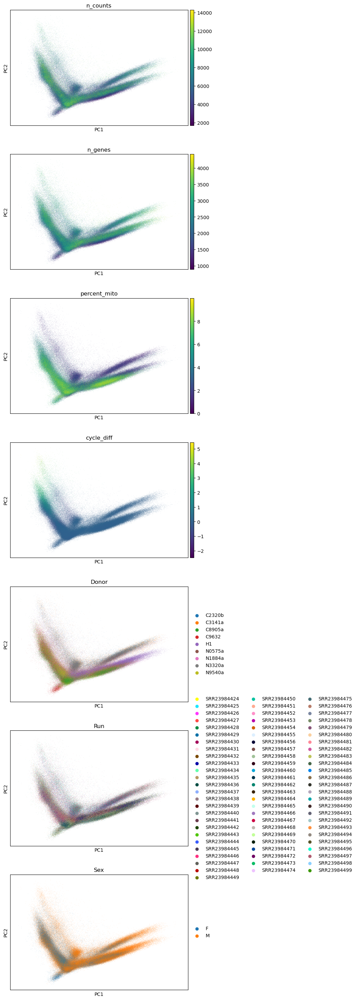

In [27]:
sc.pl.pca(sebastian_adata, color=["n_counts", "n_genes", "percent_mito", 'cycle_diff', 'Donor', 'Run', 'Sex'], ncols=1)

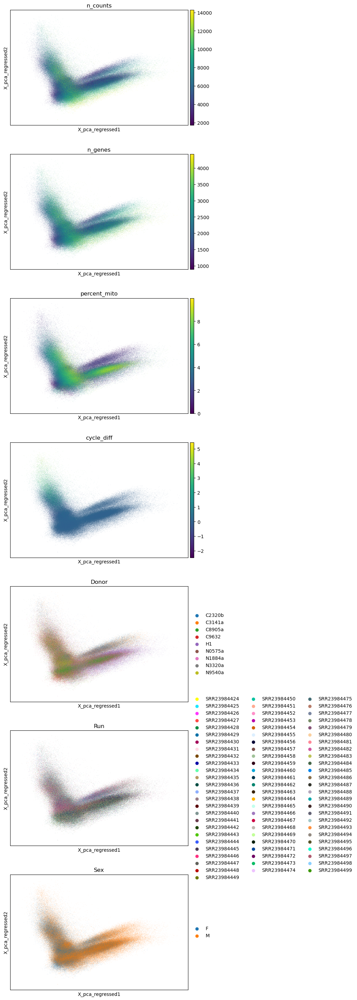

In [28]:
sc.pl.embedding(sebastian_adata, basis='X_pca_regressed', 
                color=["n_counts", "n_genes", "percent_mito", 'cycle_diff', 'Donor', 'Run', 'Sex'], ncols=1)

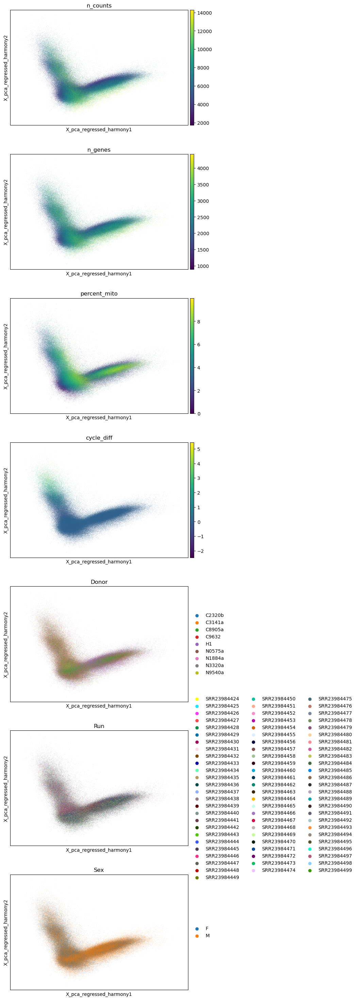

In [29]:
sc.pl.embedding(sebastian_adata, basis='X_pca_regressed_harmony', 
                color=["n_counts", "n_genes", "percent_mito", 'cycle_diff', 'Donor', 'Run', 'Sex'], ncols=1)

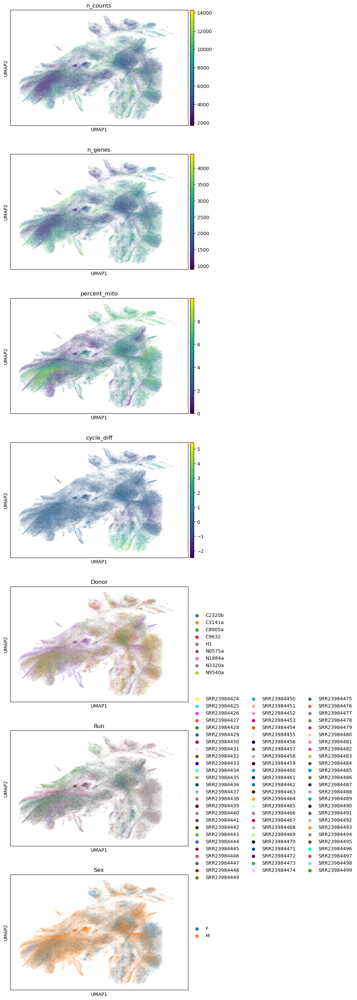

In [30]:
sc.pl.umap(sebastian_adata, color=["n_counts", "n_genes", "percent_mito", 'cycle_diff', 'Donor', 'Run', 'Sex'], ncols=1)

In [32]:
## Save Step ##

sebastian_adata.write_h5ad(os.path.join('/mnt/sdb/scz_meta_analysis_processed/sebastian_pak/anndata_objs/sebastian_qc.h5ad'))

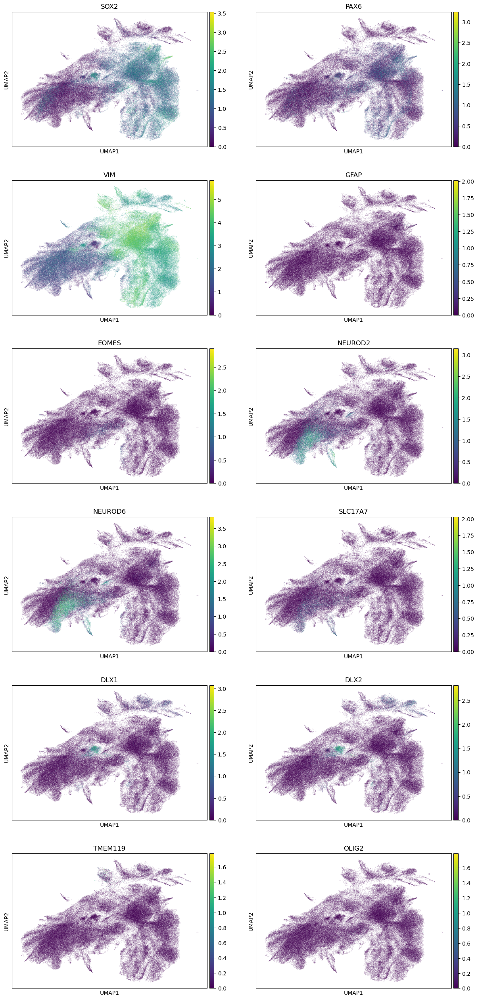

In [40]:
sc.pl.umap(sebastian_adata, color=['SOX2', 'PAX6', 'VIM', 'GFAP', 'EOMES',
                                   'NEUROD2', 'NEUROD6', 'SLC17A7', 
                                   'DLX1', 'DLX2', 'TMEM119', 'OLIG2'], ncols=2)

In [15]:
ada = sc.read_h5ad('/mnt/sdb/scz_meta_analysis_processed/sebastian_pak/anndata_objs/sebastian_qc.h5ad')

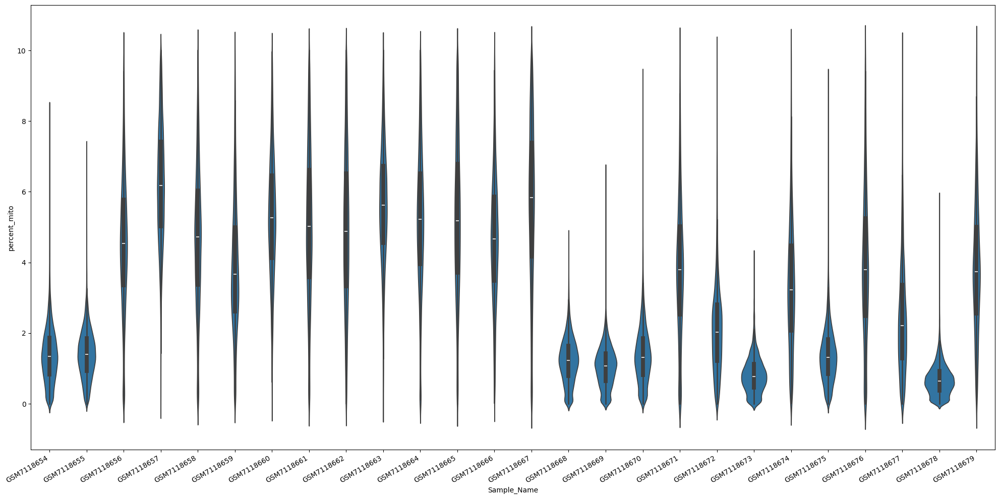

In [22]:
plt.figure(figsize=(20, 10))
sns.violinplot(ada.obs, x='Sample_Name', y='percent_mito')

plt.xticks(rotation=30, ha='right')
plt.tight_layout()


In [25]:
ada.obs.columns

Index(['library', 'Run', 'BioProject', 'BioSample', 'Patient Derived',
       'Center Name', 'Experiment', 'genotype', 'Instrument', 'Library Name',
       'procedure', 'ReleaseDate', 'create_date', 'Sample Name', 'SRA Study',
       'time_point', 'Sample_Name', 'Condition', 'Cell_Line', 'Donor',
       'Line ID', 'Name used in this study', 'Sex', 'Genotype',
       'Location of deletions', 'Diagnosis', 'Single-cell RNA sequencing',
       'Calcium Imaging', 'IHC', 'n_genes', 'n_counts', 'percent_mito', 'G1/S',
       'G2/M', 'cycle_diff', 'cycling', 'predicted_phase', 'class'],
      dtype='object')

In [18]:
ada.obs['Diagnosis'] = ada.obs['Diagnosis'].astype('str')

In [19]:
ada.obs['Diagnosis'].value_counts()

Diagnosis
nan    233060
SCZ    137513
Name: count, dtype: int64

<Axes: xlabel='genotype', ylabel='percent_mito'>

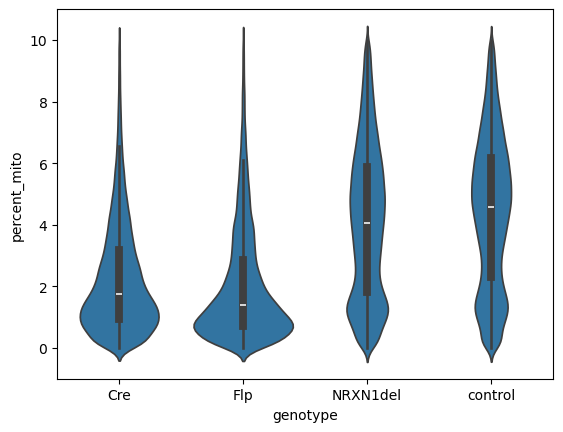

In [27]:
# plt.figure(figsize=(20,10))
sns.violinplot(ada.obs, x='genotype', y='percent_mito')

<Axes: xlabel='Donor', ylabel='percent_mito'>

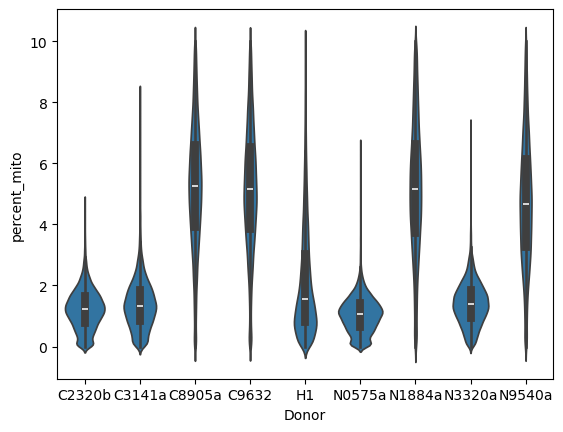

In [28]:
# plt.figure(figsize=(20,10))
sns.violinplot(ada.obs, x='Donor', y='percent_mito')